In [2]:
import sklearn as sk
import polars as pl
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import time
import plotly.express as px
import plotly.graph_objects as go
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.dummy import DummyRegressor
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, RegressorMixin

In [3]:

df = pl.read_csv("heartRate.csv")

#convert the time column to datetime
df = df.with_columns([
    pl.col("date").str.strptime(pl.Datetime, "%m/%d/%Y %H:%M")
])

#sort the data by date and time
df = df.sort("date")

# #Set aside 10% of the data for testing
# train, test = df.train_test_split(0.9)

# Create 'previous heart rate' as a feature
df = df.with_columns(pl.col("value").shift(1).alias("prev_heart_rate"))
df = df.drop_nulls()  # Remove NaN rows caused by shift()

X = df.select(["prev_heart_rate"]).to_numpy()
y = df.select(["value"]).to_numpy().flatten()

# 2.1 Create the final 10% Test Set (never used in training/validation)**
test_size = int(0.1 * len(df))
X_train, X_test = X[:-test_size], X[-test_size:]
y_train, y_test = y[:-test_size], y[-test_size:]

df


value,date,prev_heart_rate
f64,datetime[μs],f64
72.0,2021-09-08 15:09:00,75.0
74.0,2021-09-08 15:12:00,72.0
95.0,2021-09-08 16:19:00,74.0
94.0,2021-09-08 16:19:00,95.0
96.0,2021-09-08 16:19:00,94.0
…,…,…
64.5039,2025-02-23 11:10:00,65.0
55.0,2025-02-23 11:11:00,64.5039
52.0,2025-02-23 11:17:00,55.0


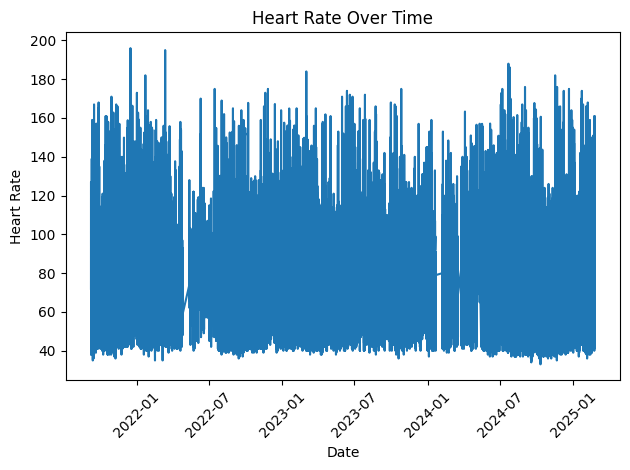

In [4]:
#Plot the data
plt.plot(df["date"], df["value"])
plt.xlabel("Date")
plt.ylabel("Heart Rate")
plt.title("Heart Rate Over Time")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [5]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df["date"], y=df["value"], mode='lines', name='lines'))
fig.update_layout(title='Heart Rate Over Time', xaxis_title='Date', yaxis_title='Heart Rate')
fig.show()

# Silly Helper functions that I really dont need

In [6]:
#Error functions
def calculate_error(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

# Function to estimate model error using scikit-learn's cross_val_score
def estimate_error(model, X, y, cv=5):
    scores = cross_val_score(model, X, y, cv=cv, scoring='neg_mean_squared_error')
    return -scores.mean()

# 2.1 Baseline Classifier

In [7]:
# A model that predicts the future value as the same as the previous value
class PersistenceModel(BaseEstimator, RegressorMixin):
    def fit(self, X, y):
        return self
    
    def predict(self, X):
        return X.flatten()


Persistence model cross-validation error: 89.6338
Persistence model test error: 50.2749
Mean baseline model cross-validation error: 831.1037
Mean baseline model test error: 1622.7156


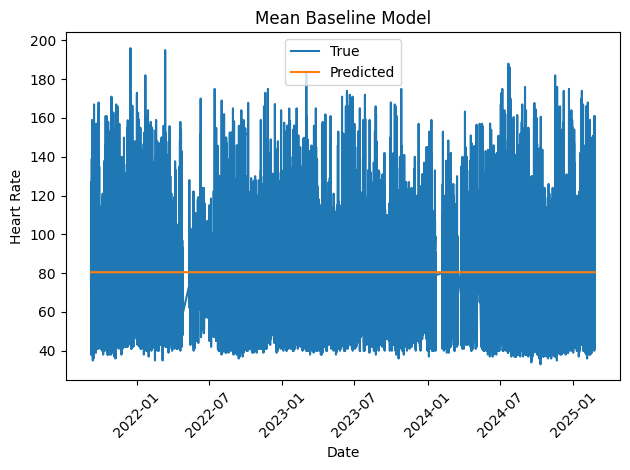

In [8]:
persistence_model = PersistenceModel()
persistence_cv_error = estimate_error(persistence_model, X_train, y_train)
print(f"Persistence model cross-validation error: {persistence_cv_error:.4f}")

# Get test error for persistence model
persistence_test_error = calculate_error(y_test, persistence_model.predict(X_test))
print(f"Persistence model test error: {persistence_test_error:.4f}")

# Mean model as an alternative baseline
mean_baseline_model = DummyRegressor(strategy="mean")
mean_baseline_cv_error = estimate_error(mean_baseline_model, X_train, y_train)
print(f"Mean baseline model cross-validation error: {mean_baseline_cv_error:.4f}")

# Train the final mean baseline model on the entire Train/Validation dataset
mean_baseline_model.fit(X_train, y_train)
mean_baseline_test_error = calculate_error(y_test, mean_baseline_model.predict(X_test))
print(f"Mean baseline model test error: {mean_baseline_test_error:.4f}")

# Plot the mean baseline model
plt.plot(df["date"], df["value"], label="True")
plt.plot(df["date"], mean_baseline_model.predict(X), label="Predicted")
plt.xlabel("Date")
plt.ylabel("Heart Rate")
plt.title("Mean Baseline Model")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()




Linear model cross-validation error: 87.6116
Linear model test error: 52.3067


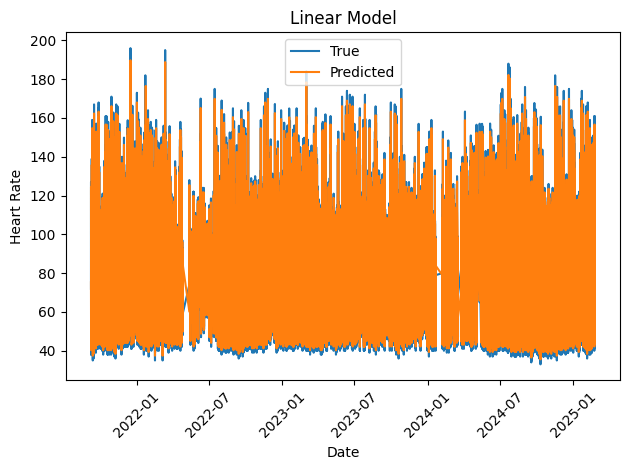

In [9]:
#2.2.1 Train a linear regression model
linear_model = LinearRegression()
linear_model_cv_error = estimate_error(linear_model, X_train, y_train)
print(f"Linear model cross-validation error: {linear_model_cv_error:.4f}")

# Train the final linear model on the entire Train/Validation dataset
linear_model.fit(X_train, y_train)

linear_model_test_error = calculate_error(y_test, linear_model.predict(X_test))
print(f"Linear model test error: {linear_model_test_error:.4f}")

# Plot the linear model
plt.plot(df["date"], df["value"], label="True")
plt.plot(df["date"], linear_model.predict(X), label="Predicted")
plt.xlabel("Date")
plt.ylabel("Heart Rate")
plt.title("Linear Model")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


Polynomial (degree 1) cross-validation error: 87.6116
Polynomial (degree 2) cross-validation error: 86.4608
Polynomial (degree 3) cross-validation error: 86.4728
Polynomial (degree 4) cross-validation error: 86.2090
Polynomial (degree 5) cross-validation error: 86.6933
Polynomial (degree 6) cross-validation error: 87.5278
Polynomial (degree 7) cross-validation error: 89.1845
Polynomial (degree 8) cross-validation error: 92.6948
Polynomial (degree 9) cross-validation error: 100.4284


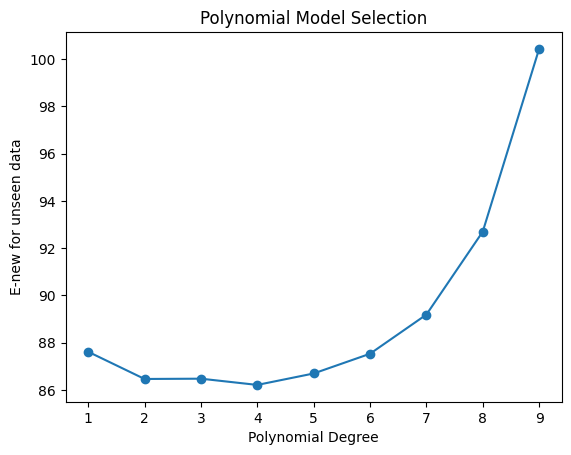

Best polynomial degree: 4
Best polynomial model test error: 49.4904


In [10]:
# 2.2.2 Polynomial features without regularization
# Sweep over polynomial degrees
poly_degrees = range(1, 10)  
cv_errors = []

for degree in poly_degrees:
    poly_model = Pipeline([
        ('poly', PolynomialFeatures(degree=degree)),
        ('linear', LinearRegression())
    ])
    poly_cv_error = estimate_error(poly_model, X_train, y_train)
    cv_errors.append(poly_cv_error)
    print(f"Polynomial (degree {degree}) cross-validation error: {poly_cv_error:.4f}")

# Plot the polynomial degree vs. cross-validation error
plt.plot(poly_degrees, cv_errors, marker='o')
plt.xlabel("Polynomial Degree")
plt.ylabel("E-new for unseen data")
plt.title("Polynomial Model Selection")
plt.xticks(poly_degrees)
plt.show()


# Find best polynomial degree
best_poly_degree = poly_degrees[np.argmin(cv_errors)]
print(f"Best polynomial degree: {best_poly_degree}")


# Train final polynomial model without regularization
best_poly_model = Pipeline([
    ('poly', PolynomialFeatures(degree=best_poly_degree)),
    ('linear', LinearRegression())
])

best_poly_model.fit(X_train, y_train)

poly_test_error = calculate_error(y_test, best_poly_model.predict(X_test))
print(f"Best polynomial model test error: {poly_test_error:.4f}")

# 2.3 Models with Regularization

## Lasso

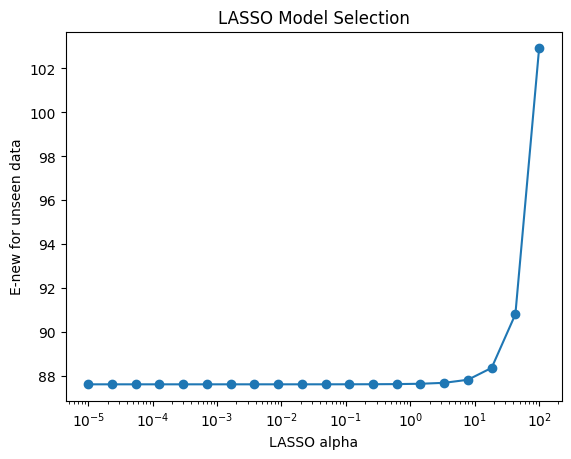

Best LASSO alpha: 0.000010
Best LASSO model test error: 52.3067


In [27]:
# Define regularization parameter ranges
# Using logarithmic scales for alpha values
alphas = np.logspace(-5, 2, num=20)

# L1 (LASSO) Regularization
lasso_cv_errors = []
for alpha in alphas:
    lasso_model = Lasso(alpha=alpha, max_iter=10000, random_state=42)
    lasso_cv_error = estimate_error(lasso_model, X_train, y_train)
    lasso_cv_errors.append(lasso_cv_error)

#Plot the LASSO regularization parameter vs. cross-validation error
plt.plot(alphas, lasso_cv_errors, marker='o')
plt.xscale('log')
plt.xlabel("LASSO alpha")
plt.ylabel("E-new for unseen data")
plt.title("LASSO Model Selection")
plt.show()

best_lasso_alpha = alphas[np.argmin(lasso_cv_errors)]
print(f"Best LASSO alpha: {best_lasso_alpha:.6f}")

# Train final LASSO model
best_lasso_model = Lasso(alpha=best_lasso_alpha, max_iter=10000, random_state=42)
best_lasso_model.fit(X_train, y_train)
lasso_test_error = calculate_error(y_test, best_lasso_model.predict(X_test))
print(f"Best LASSO model test error: {lasso_test_error:.4f}")


## 2.3.2 L2 Ridge

Ridge (alpha=0.000010) cross-validation error: 87.6116
Ridge (alpha=0.000023) cross-validation error: 87.6116
Ridge (alpha=0.000055) cross-validation error: 87.6116
Ridge (alpha=0.000127) cross-validation error: 87.6116
Ridge (alpha=0.000298) cross-validation error: 87.6116
Ridge (alpha=0.000695) cross-validation error: 87.6116
Ridge (alpha=0.001624) cross-validation error: 87.6116
Ridge (alpha=0.003793) cross-validation error: 87.6116
Ridge (alpha=0.008859) cross-validation error: 87.6116
Ridge (alpha=0.020691) cross-validation error: 87.6116
Ridge (alpha=0.048329) cross-validation error: 87.6116
Ridge (alpha=0.112884) cross-validation error: 87.6116
Ridge (alpha=0.263665) cross-validation error: 87.6116
Ridge (alpha=0.615848) cross-validation error: 87.6116
Ridge (alpha=1.438450) cross-validation error: 87.6116
Ridge (alpha=3.359818) cross-validation error: 87.6116
Ridge (alpha=7.847600) cross-validation error: 87.6116
Ridge (alpha=18.329807) cross-validation error: 87.6116
Ridge (al

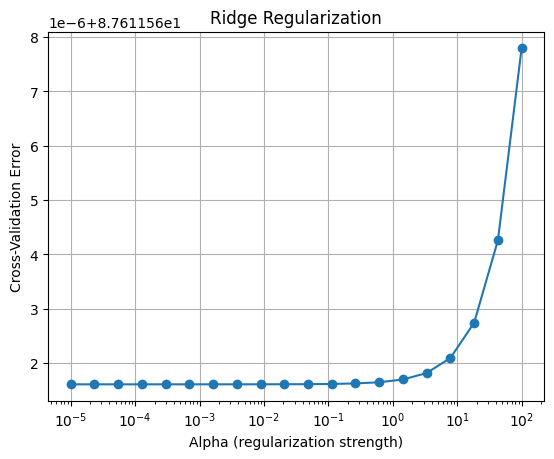

Best Ridge alpha: 0.000010
Best Ridge model test error: 52.3067


In [28]:
ridge_cv_errors = []

for alpha in alphas:
    ridge_model = Ridge(alpha=alpha)
    ridge_cv_error = estimate_error(ridge_model, X_train, y_train)
    ridge_cv_errors.append(ridge_cv_error)
    print(f"Ridge (alpha={alpha:.6f}) cross-validation error: {ridge_cv_error:.4f}")

# Plot Ridge alpha vs. cross-validation error
plt.semilogx(alphas, ridge_cv_errors, marker='o')
plt.xlabel("Alpha (regularization strength)")
plt.ylabel("Cross-Validation Error")
plt.title("Ridge Regularization")
plt.grid(True)
plt.show()

# Find best alpha for Ridge
best_ridge_alpha = alphas[np.argmin(ridge_cv_errors)]
print(f"Best Ridge alpha: {best_ridge_alpha:.6f}")

# Train final Ridge model
best_ridge_model = Ridge(alpha=best_ridge_alpha)
best_ridge_model.fit(X_train, y_train)
ridge_test_error = calculate_error(y_test, best_ridge_model.predict(X_test))
print(f"Best Ridge model test error: {ridge_test_error:.4f}")

## 2.3.3 Elastic Net Regularization

ElasticNet (alpha=0.000010, l1_ratio=0.1) cv error: 87.6116
ElasticNet (alpha=0.000010, l1_ratio=0.3) cv error: 87.6116
ElasticNet (alpha=0.000010, l1_ratio=0.5) cv error: 87.6116
ElasticNet (alpha=0.000010, l1_ratio=0.7) cv error: 87.6116
ElasticNet (alpha=0.000010, l1_ratio=0.9) cv error: 87.6116
ElasticNet (alpha=0.000023, l1_ratio=0.1) cv error: 87.6116
ElasticNet (alpha=0.000023, l1_ratio=0.3) cv error: 87.6116
ElasticNet (alpha=0.000023, l1_ratio=0.5) cv error: 87.6116
ElasticNet (alpha=0.000023, l1_ratio=0.7) cv error: 87.6116
ElasticNet (alpha=0.000023, l1_ratio=0.9) cv error: 87.6116
ElasticNet (alpha=0.000055, l1_ratio=0.1) cv error: 87.6116
ElasticNet (alpha=0.000055, l1_ratio=0.3) cv error: 87.6116
ElasticNet (alpha=0.000055, l1_ratio=0.5) cv error: 87.6116
ElasticNet (alpha=0.000055, l1_ratio=0.7) cv error: 87.6116
ElasticNet (alpha=0.000055, l1_ratio=0.9) cv error: 87.6116
ElasticNet (alpha=0.000127, l1_ratio=0.1) cv error: 87.6116
ElasticNet (alpha=0.000127, l1_ratio=0.3

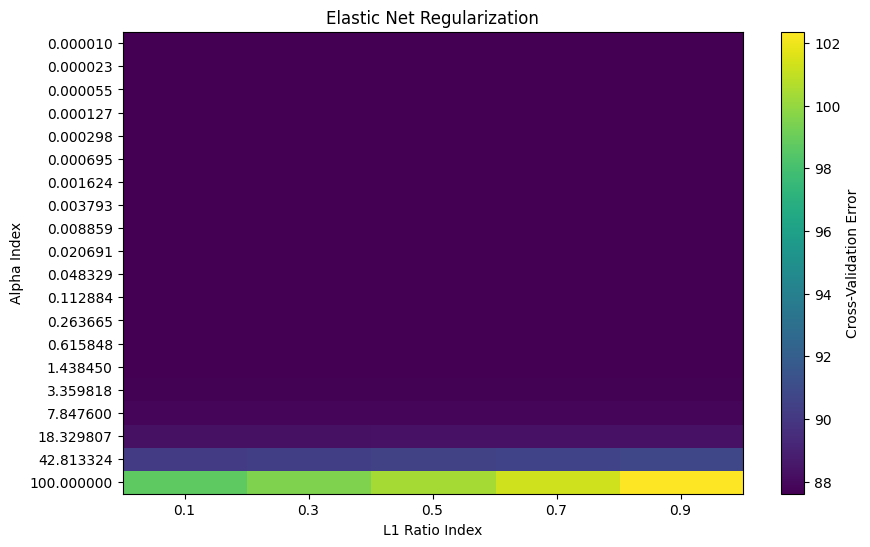

Best Elastic Net alpha: 0.000010, l1_ratio: 0.1
Best Elastic Net model test error: 52.3067


In [29]:
l1_ratios = [0.1, 0.3, 0.5, 0.7, 0.9]
elastic_cv_errors = np.zeros((len(alphas), len(l1_ratios)))

for i, alpha in enumerate(alphas):
    for j, l1_ratio in enumerate(l1_ratios):
        elastic_model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, max_iter=10000)
        elastic_cv_error = estimate_error(elastic_model, X_train, y_train)
        elastic_cv_errors[i, j] = elastic_cv_error
        print(f"ElasticNet (alpha={alpha:.6f}, l1_ratio={l1_ratio}) cv error: {elastic_cv_error:.4f}")

# Create a heatmap of the results
plt.figure(figsize=(10, 6))
plt.imshow(elastic_cv_errors, interpolation='nearest', aspect='auto')
plt.xlabel("L1 Ratio Index")
plt.ylabel("Alpha Index")
plt.colorbar(label='Cross-Validation Error')
plt.title("Elastic Net Regularization")
plt.xticks(range(len(l1_ratios)), [f"{ratio:.1f}" for ratio in l1_ratios])
plt.yticks(range(len(alphas)), [f"{alpha:.6f}" for alpha in alphas])
plt.show()

# Find best hyperparameters for Elastic Net
min_i, min_j = np.unravel_index(np.argmin(elastic_cv_errors), elastic_cv_errors.shape)
best_elastic_alpha = alphas[min_i]
best_elastic_l1_ratio = l1_ratios[min_j]
print(f"Best Elastic Net alpha: {best_elastic_alpha:.6f}, l1_ratio: {best_elastic_l1_ratio:.1f}")

# Train final Elastic Net model
best_elastic_model = ElasticNet(alpha=best_elastic_alpha, l1_ratio=best_elastic_l1_ratio, max_iter=10000)
best_elastic_model.fit(X_train, y_train)
elastic_test_error = calculate_error(y_test, best_elastic_model.predict(X_test))
print(f"Best Elastic Net model test error: {elastic_test_error:.4f}")


## Polynomial features, L1 (LASSO) regularization

In [ ]:
print("best_poly_degree", best_poly_degree)
lasso_poly_cv_errors = np.zeros((len(alphas), len(range(1, best_poly_degree + 1))))

for i, alpha in enumerate(alphas):
    for j, degree in enumerate(range(1, best_poly_degree + 1)):
        lasso_poly_model = Pipeline([
            ('poly', PolynomialFeatures(degree=degree)),
            ('scaler', StandardScaler()),
            ('lasso', Lasso(alpha=alpha, max_iter=50000, random_state=42, tol=1e-3))
        ])
        lasso_poly_cv_error = estimate_error(lasso_poly_model, X_train, y_train)
        lasso_poly_cv_errors[i, j] = lasso_poly_cv_error
        print(f"LASSO Poly (alpha={alpha:.6f}, degree={degree}) cv error: {lasso_poly_cv_error:.4f}")

# Create a heatmap for LASSO with polynomial features
plt.figure(figsize=(10, 6))
plt.imshow(lasso_poly_cv_errors, interpolation='nearest', aspect='auto')
plt.xlabel("Polynomial Degree")
plt.ylabel("Alpha Index")
plt.colorbar(label='Cross-Validation Error')
plt.title("LASSO with Polynomial Features")
plt.xticks(range(best_poly_degree), range(1, best_poly_degree + 1))
plt.yticks(range(len(alphas)), [f"{alpha:.6f}" for alpha in alphas])
plt.show()

# Find best hyperparameters for LASSO with polynomial features
min_i, min_j = np.unravel_index(np.argmin(lasso_poly_cv_errors), lasso_poly_cv_errors.shape)
best_lasso_poly_alpha = alphas[min_i]
best_lasso_poly_degree = min_j + 1  # +1 because degrees start at 1
print(f"Best LASSO Poly alpha: {best_lasso_poly_alpha:.6f}, degree: {best_lasso_poly_degree}")

# Train final LASSO with polynomial features model
best_lasso_poly_model = Pipeline([
    ('poly', PolynomialFeatures(degree=best_lasso_poly_degree)),
    ('lasso', Lasso(alpha=best_lasso_poly_alpha, max_iter=10000))
])
best_lasso_poly_model.fit(X_train, y_train)
lasso_poly_test_error = calculate_error(y_test, best_lasso_poly_model.predict(X_test))
print(f"Best LASSO with polynomial features test error: {lasso_poly_test_error:.4f}")


best_poly_degree 4
LASSO Poly (alpha=0.000010, degree=1) cv error: 87.6116
LASSO Poly (alpha=0.000010, degree=2) cv error: 86.4608
LASSO Poly (alpha=0.000010, degree=3) cv error: 86.4726


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.784e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.830e+06, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.920e+06, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

LASSO Poly (alpha=0.000010, degree=4) cv error: 86.1404
LASSO Poly (alpha=0.000023, degree=1) cv error: 87.6116
LASSO Poly (alpha=0.000023, degree=2) cv error: 86.4608
LASSO Poly (alpha=0.000023, degree=3) cv error: 86.4722


KeyboardInterrupt: 

## Polynomial features, L2 regularization

In [ ]:
# Define a wider range of polynomial degrees to explore
min_degree = 1
max_degree = 15 

# For LASSO with polynomial features
lasso_poly_cv_errors = np.zeros((len(alphas), max_degree))

for i, alpha in enumerate(alphas):
    for j, degree in enumerate(range(min_degree, max_degree + 1)):
        lasso_poly_model = Pipeline([
            ('poly', PolynomialFeatures(degree=degree)),
            ('scaler', StandardScaler()),  # Add scaling to help with convergence
            ('lasso', Lasso(alpha=alpha, max_iter=100000, tol=1e-3))
        ])
        lasso_poly_cv_error = estimate_error(lasso_poly_model, X_train, y_train)
        lasso_poly_cv_errors[i, j-1] = lasso_poly_cv_error  # j-1 because degrees start at 1 but array indices at 0
        print(f"LASSO Poly (alpha={alpha:.6f}, degree={degree}) cv error: {lasso_poly_cv_error:.4f}")

# Create a heatmap for LASSO with polynomial features
plt.figure(figsize=(12, 6))
plt.imshow(lasso_poly_cv_errors, interpolation='nearest', aspect='auto')
plt.xlabel("Polynomial Degree")
plt.ylabel("Alpha Index")
plt.colorbar(label='Cross-Validation Error')
plt.title("LASSO with Polynomial Features")
plt.xticks(range(max_degree), range(min_degree, max_degree + 1))
plt.yticks(range(len(alphas)), [f"{alpha:.6f}" for alpha in alphas])
plt.show()

# Find best hyperparameters for LASSO with polynomial features
min_i, min_j = np.unravel_index(np.argmin(lasso_poly_cv_errors), lasso_poly_cv_errors.shape)
best_lasso_poly_alpha = alphas[min_i]
best_lasso_poly_degree = min_j + 1  # +1 because array indices start at 0 but degrees start at 1
print(f"Best LASSO Poly alpha: {best_lasso_poly_alpha:.6f}, degree: {best_lasso_poly_degree}")

Ridge Poly (alpha=0.000010, degree=1) cv error: 87.6116
Ridge Poly (alpha=0.000010, degree=2) cv error: 86.4608
Ridge Poly (alpha=0.000010, degree=3) cv error: 86.4728
Ridge Poly (alpha=0.000010, degree=4) cv error: 86.2090
Ridge Poly (alpha=0.000023, degree=1) cv error: 87.6116
Ridge Poly (alpha=0.000023, degree=2) cv error: 86.4608
Ridge Poly (alpha=0.000023, degree=3) cv error: 86.4728
Ridge Poly (alpha=0.000023, degree=4) cv error: 86.2090
Ridge Poly (alpha=0.000055, degree=1) cv error: 87.6116
Ridge Poly (alpha=0.000055, degree=2) cv error: 86.4608
Ridge Poly (alpha=0.000055, degree=3) cv error: 86.4728
Ridge Poly (alpha=0.000055, degree=4) cv error: 86.2090
Ridge Poly (alpha=0.000127, degree=1) cv error: 87.6116
Ridge Poly (alpha=0.000127, degree=2) cv error: 86.4608
Ridge Poly (alpha=0.000127, degree=3) cv error: 86.4728
Ridge Poly (alpha=0.000127, degree=4) cv error: 86.2090
Ridge Poly (alpha=0.000298, degree=1) cv error: 87.6116
Ridge Poly (alpha=0.000298, degree=2) cv error: 

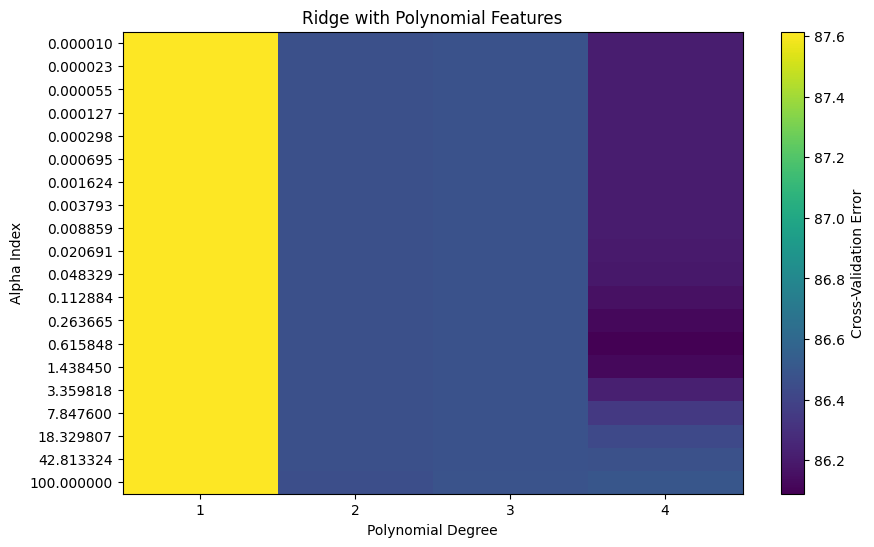

Best Ridge Poly alpha: 0.615848, degree: 4
Best Ridge with polynomial features test error: 49.4904


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning:

Ill-conditioned matrix (rcond=1.34937e-22): result may not be accurate.



In [ ]:
# For L2 (Ridge) with polynomial features
ridge_poly_cv_errors = np.zeros((len(alphas), len(range(1, best_poly_degree + 1))))

for i, alpha in enumerate(alphas):
    for j, degree in enumerate(range(1, best_poly_degree + 1)):
        ridge_poly_model = Pipeline([
            ('poly', PolynomialFeatures(degree=degree)),
            ('scaler', StandardScaler()),
            ('ridge', Ridge(alpha=alpha))
        ])
        ridge_poly_cv_error = estimate_error(ridge_poly_model, X_train, y_train)
        ridge_poly_cv_errors[i, j] = ridge_poly_cv_error
        print(f"Ridge Poly (alpha={alpha:.6f}, degree={degree}) cv error: {ridge_poly_cv_error:.4f}")

# Create a heatmap for Ridge with polynomial features
plt.figure(figsize=(10, 6))
plt.imshow(ridge_poly_cv_errors, interpolation='nearest', aspect='auto')
plt.xlabel("Polynomial Degree")
plt.ylabel("Alpha Index")
plt.colorbar(label='Cross-Validation Error')
plt.title("Ridge with Polynomial Features")
plt.xticks(range(best_poly_degree), range(1, best_poly_degree + 1))
plt.yticks(range(len(alphas)), [f"{alpha:.6f}" for alpha in alphas])
plt.show()

# Find best hyperparameters for Ridge with polynomial features
min_i, min_j = np.unravel_index(np.argmin(ridge_poly_cv_errors), ridge_poly_cv_errors.shape)
best_ridge_poly_alpha = alphas[min_i]
best_ridge_poly_degree = min_j + 1  # +1 because degrees start at 1
print(f"Best Ridge Poly alpha: {best_ridge_poly_alpha:.6f}, degree: {best_ridge_poly_degree}")

# Train final Ridge with polynomial features model
best_ridge_poly_model = Pipeline([
    ('poly', PolynomialFeatures(degree=best_ridge_poly_degree)),
    ('ridge', Ridge(alpha=best_ridge_poly_alpha))
])
best_ridge_poly_model.fit(X_train, y_train)
ridge_poly_test_error = calculate_error(y_test, best_ridge_poly_model.predict(X_test))
print(f"Best Ridge with polynomial features test error: {ridge_poly_test_error:.4f}")


In [ ]:

# Find best hyperparameters for Ridge with polynomial features
min_i, min_j = np.unravel_index(np.argmin(ridge_poly_cv_errors), ridge_poly_cv_errors.shape)
best_ridge_poly_alpha = alphas[min_i]
best_ridge_poly_degree = min_j + 1  # +1 because degrees start at 1
print(f"Best Ridge Poly alpha: {best_ridge_poly_alpha:.6f}, degree: {best_ridge_poly_degree}")

# Train final Ridge with polynomial features model
best_ridge_poly_model = Pipeline([
    ('poly', PolynomialFeatures(degree=best_ridge_poly_degree)),
    ('ridge', Ridge(alpha=best_ridge_poly_alpha))
])
best_ridge_poly_model.fit(X_train, y_train)
ridge_poly_test_error = calculate_error(y_test, best_ridge_poly_model.predict(X_test))
print(f"Best Ridge with polynomial features test error: {ridge_poly_test_error:.4f}")

# For Elastic Net with polynomial features
# To simplify, we'll just use the best l1_ratio from the previous Elastic Net experiment
elastic_poly_cv_errors = np.zeros((len(alphas), len(range(1, best_poly_degree + 1))))

for i, alpha in enumerate(alphas):
    for j, degree in enumerate(range(1, best_poly_degree + 1)):
        elastic_poly_model = Pipeline([
            ('poly', PolynomialFeatures(degree=degree)),
            ('elastic', ElasticNet(alpha=alpha, l1_ratio=best_elastic_l1_ratio, max_iter=10000))
        ])
        elastic_poly_cv_error = estimate_error(elastic_poly_model, X_train, y_train)
        elastic_poly_cv_errors[i, j] = elastic_poly_cv_error
        print(f"ElasticNet Poly (alpha={alpha:.6f}, l1_ratio={best_elastic_l1_ratio}, degree={degree}) cv error: {elastic_poly_cv_error:.4f}")

# Create a heatmap for Elastic Net with polynomial features
plt.figure(figsize=(10, 6))
plt.imshow(elastic_poly_cv_errors, interpolation='nearest', aspect='auto')
plt.xlabel("Polynomial Degree")
plt.ylabel("Alpha Index")
plt.colorbar(label='Cross-Validation Error')
plt.title(f"Elastic Net (l1_ratio={best_elastic_l1_ratio}) with Polynomial Features")
plt.xticks(range(best_poly_degree), range(1, best_poly_degree + 1))
plt.yticks(range(len(alphas)), [f"{alpha:.6f}" for alpha in alphas])
plt.show()


# Find best hyperparameters for Elastic Net with polynomial features
min_i, min_j = np.unravel_index(np.argmin(elastic_poly_cv_errors), elastic_poly_cv_errors.shape)
best_elastic_poly_alpha = alphas[min_i]
best_elastic_poly_degree = min_j + 1  # +1 because degrees start at 1
print(f"Best Elastic Net Poly alpha: {best_elastic_poly_alpha:.6f}, degree: {best_elastic_poly_degree}")

# Train final Elastic Net with polynomial features model
best_elastic_poly_model = Pipeline([
    ('poly', PolynomialFeatures(degree=best_elastic_poly_degree)),
    ('elastic', ElasticNet(alpha=best_elastic_poly_alpha, l1_ratio=best_elastic_l1_ratio, max_iter=10000))
])
best_elastic_poly_model.fit(X_train, y_train)
elastic_poly_test_error = calculate_error(y_test, best_elastic_poly_model.predict(X_test))
print(f"Best Elastic Net with polynomial features test error: {elastic_poly_test_error:.4f}")


Best Ridge Poly alpha: 0.615848, degree: 4
Best Ridge with polynomial features test error: 49.4904


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning:

Ill-conditioned matrix (rcond=1.34937e-22): result may not be accurate.



ElasticNet Poly (alpha=0.000010, l1_ratio=0.1, degree=1) cv error: 87.6116
ElasticNet Poly (alpha=0.000010, l1_ratio=0.1, degree=2) cv error: 86.4608


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.063e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.008e+07, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.018e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.000010, l1_ratio=0.1, degree=3) cv error: 86.4728


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.054e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.008e+07, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.016e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.000010, l1_ratio=0.1, degree=4) cv error: 86.3757
ElasticNet Poly (alpha=0.000023, l1_ratio=0.1, degree=1) cv error: 87.6116
ElasticNet Poly (alpha=0.000023, l1_ratio=0.1, degree=2) cv error: 86.4608


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.062e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.006e+07, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.017e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.000023, l1_ratio=0.1, degree=3) cv error: 86.4728


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.054e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.008e+07, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.016e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.000023, l1_ratio=0.1, degree=4) cv error: 86.3757
ElasticNet Poly (alpha=0.000055, l1_ratio=0.1, degree=1) cv error: 87.6116
ElasticNet Poly (alpha=0.000055, l1_ratio=0.1, degree=2) cv error: 86.4608


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.059e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.002e+07, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.016e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.000055, l1_ratio=0.1, degree=3) cv error: 86.4728


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.054e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.008e+07, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.016e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.000055, l1_ratio=0.1, degree=4) cv error: 86.3757
ElasticNet Poly (alpha=0.000127, l1_ratio=0.1, degree=1) cv error: 87.6116
ElasticNet Poly (alpha=0.000127, l1_ratio=0.1, degree=2) cv error: 86.4608


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.053e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.912e+06, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.014e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.000127, l1_ratio=0.1, degree=3) cv error: 86.4728


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.054e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.008e+07, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.016e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.000127, l1_ratio=0.1, degree=4) cv error: 86.3757
ElasticNet Poly (alpha=0.000298, l1_ratio=0.1, degree=1) cv error: 87.6116
ElasticNet Poly (alpha=0.000298, l1_ratio=0.1, degree=2) cv error: 86.4608


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.038e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.660e+06, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.009e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.000298, l1_ratio=0.1, degree=3) cv error: 86.4728


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.054e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.008e+07, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.016e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.000298, l1_ratio=0.1, degree=4) cv error: 86.3758
ElasticNet Poly (alpha=0.000695, l1_ratio=0.1, degree=1) cv error: 87.6116
ElasticNet Poly (alpha=0.000695, l1_ratio=0.1, degree=2) cv error: 86.4608


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.003e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.025e+06, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.978e+06, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.000695, l1_ratio=0.1, degree=3) cv error: 86.4729


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.054e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.008e+07, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.016e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.000695, l1_ratio=0.1, degree=4) cv error: 86.3760
ElasticNet Poly (alpha=0.001624, l1_ratio=0.1, degree=1) cv error: 87.6116
ElasticNet Poly (alpha=0.001624, l1_ratio=0.1, degree=2) cv error: 86.4608


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.924e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.246e+06, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.724e+06, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.001624, l1_ratio=0.1, degree=3) cv error: 86.4730


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.054e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.008e+07, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.016e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.001624, l1_ratio=0.1, degree=4) cv error: 86.3765
ElasticNet Poly (alpha=0.003793, l1_ratio=0.1, degree=1) cv error: 87.6116
ElasticNet Poly (alpha=0.003793, l1_ratio=0.1, degree=2) cv error: 86.4607


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.743e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.082e+06, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.197e+06, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.003793, l1_ratio=0.1, degree=3) cv error: 86.4734


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.054e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.008e+07, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.016e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.003793, l1_ratio=0.1, degree=4) cv error: 86.3777
ElasticNet Poly (alpha=0.008859, l1_ratio=0.1, degree=1) cv error: 87.6117
ElasticNet Poly (alpha=0.008859, l1_ratio=0.1, degree=2) cv error: 86.4607


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.352e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.232e+06, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.265e+06, tolerance: 1.851e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.008859, l1_ratio=0.1, degree=3) cv error: 86.4742


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.055e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.008e+07, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.016e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.008859, l1_ratio=0.1, degree=4) cv error: 86.3804
ElasticNet Poly (alpha=0.020691, l1_ratio=0.1, degree=1) cv error: 87.6119
ElasticNet Poly (alpha=0.020691, l1_ratio=0.1, degree=2) cv error: 86.4605


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.568e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.257e+06, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.806e+06, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.020691, l1_ratio=0.1, degree=3) cv error: 86.4762


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.057e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.008e+07, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.017e+07, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.020691, l1_ratio=0.1, degree=4) cv error: 86.3868
ElasticNet Poly (alpha=0.048329, l1_ratio=0.1, degree=1) cv error: 87.6123
ElasticNet Poly (alpha=0.048329, l1_ratio=0.1, degree=2) cv error: 86.4601


/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.219e+06, tolerance: 2.010e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.106e+06, tolerance: 1.990e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.194e+06, tolerance: 2.105e+04

/home/troy/ml/.venv/lib/python3.12/site-packages/

ElasticNet Poly (alpha=0.048329, l1_ratio=0.1, degree=3) cv error: 86.4813


In [ ]:
# Collect all models and their test errors
models = {
    'Persistence Baseline': (persistence_model, persistence_test_error),
    'Mean Baseline': (mean_baseline_model, mean_baseline_test_error),
    'Linear Regression': (linear_model, linear_model_test_error),
    f'Polynomial (degree {best_poly_degree})': (best_poly_model, poly_test_error),
    'LASSO': (best_lasso_model, lasso_test_error),
    'Ridge': (best_ridge_model, ridge_test_error),
    'Elastic Net': (best_elastic_model, elastic_test_error),
    f'LASSO Poly (degree {best_lasso_poly_degree})': (best_lasso_poly_model, lasso_poly_test_error),
    f'Ridge Poly (degree {best_ridge_poly_degree})': (best_ridge_poly_model, ridge_poly_test_error),
    f'Elastic Net Poly (degree {best_elastic_poly_degree})': (best_elastic_poly_model, elastic_poly_test_error)
}

# Sort models by test error
sorted_models = sorted(models.items(), key=lambda x: x[1][1])

# Plot all models' test errors
plt.figure(figsize=(12, 8))
names = [model[0] for model in sorted_models]
errors = [model[1][1] for model in sorted_models]
plt.barh(range(len(names)), errors, align='center')
plt.yticks(range(len(names)), names)
plt.xlabel('Test Error (MSE)')
plt.title('Model Comparison')
plt.grid(True)
plt.tight_layout()
plt.show()

# Print a summary of all models' performance
print("\nSummary of Model Performance (Test Error):")
for name, (model, error) in sorted_models:
    print(f"{name}: {error:.4f}")

# Identify the best model
best_model_name = sorted_models[0][0]
best_model, best_error = sorted_models[0][1]
print(f"\nBest model: {best_model_name} with test error: {best_error:.4f}")

# Plot predictions from the best model
plt.figure(figsize=(12, 6))
plt.plot(df["date"], df["value"], label="True", alpha=0.7)
plt.plot(df["date"][-test_size:], best_model.predict(X_test), label=f"Predicted ({best_model_name})", linewidth=2)
plt.xlabel("Date")
plt.ylabel("Heart Rate")
plt.title(f"Best Model: {best_model_name}")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()